# COGS 118B - Final Project

# Minimax Chess

## Group members

- Colin Sutedja
- Elizabeth Lee

# Abstract 
The goal of this project is to develop an AI-generated model to optimize moves of players in the game of chess. The data that will be used are various positions that users can take and move as well as the results, which is measured in states of the boards, player moves, and the resulting state of the game. The success of the player will be measured by the scores. The evaluation function will be a summation of the material score and the individual piece scores. The material score is calculated from how many of each type of piece is on the board while the individual piece scores are in which specific position each piece is on. If the player playing white wins, it will return the winner’s color as well as scores for both players. If there is a stalemate or there is insufficient material to determine a definite winner, the scores of the players are compared to return the player with the higher score as the winner. The score values will convince the player to make more strategic decisions in order to optimize the resulting reward.


# Background

Chess is a game of intricate strategies and tactics which has captivated many players all around the world. This game has two players, white and black, with six different types of pieces – the pawn, rook, knight, bishop, queen, and king, where each piece has a unique power and limitation, shaping the dynamic flow of the game. The goal of the game is to protect the king from being captured while also attempting to take the opponent player’s king. The pawn is only able to move forward one square but can also capture the opposing teams pieces diagonally one square ahead. The rooks are able to move horizontally or vertically as long as there are no obstacle pieces in the way. Knights are able to move in a L-shape in any direction, and they are able to jump over pieces in their path. Bishops are able to move diagonally as long as there are no obstacle pieces in the way. Queens can move in any direction as long as there are no obstacles as well. Kings can only move one square in any direction. 


A game of chess can be divided into three phases of the opening, the middlegame, and the endgame. The opening is often used to focus on developing pieces and taking control of the board. The middlegame is to carry out unique tactics to attack against the opponent player’s king and take as many kills as possible. The endgame is used to promote pawns to make their final attack against the opponent’s king. <a name="britannicanote"></a>[<sup>[1]</sup>](#britannica)


Furthermore, computers and AI have been used in the realm of the game of chess for many years. In 1948, Claude Shannon released a paper that focused on how developing a chess program would result in machines that could either work as language translators or for military strategy. Shannon emphasized that the machine would have to select moves that were legal while making sure it was minimizing the possibility of future positions that resulted in checkmates. The evaluation function that was used focused on how each position of the player was to weigh a multitude of different criteria such as: condition of the pawns, the mobility of the other types of pieces, and higher emphasis on pieces that were placed in a higher advantageous position. These evaluation functions allowed the machine to determine which actions were more favorable for the player. <a name="stanfordnote"></a>[<sup>[2]</sup>](#stanford)


Some AI agents that were developed include the original chess engine, Turochamp, which was evaluated by Alan Turing similarly to Shannon’s original idea. Turochamp has a search algorithm which calculates every possible move and continues with moves until none are possible. The evaluation of the states were determined by the piece values, piece mobility, piece defense, as well as the safety of the king. However, due to the limited depth of search, it could only evaluate a few moves ahead. <a name="turingnote"></a>[<sup>[3]</sup>](#turing)


In the 1950s, another well-known solution was developed by Alex Bernstein, a programmer from IBM. The Bernstein chess program incorporated basic algorithms to generate moves that were legal according to the rules of the game as well as evaluate the positions of the pieces. The search strategy incorporated a form of the minimax algorithm to search a few moves ahead: around two moves per player. In order to improve efficiency, they used optimization techniques such as pruning of the search tree. <a name="ibmnote"></a>[<sup>[4]</sup>](#ibm)


Another algorithm is called Leela Chess Zero (LCZero or Lc0), which is a neural network-based engine that searches a tree that has nodes of game states. Each node has an approximated value as well as a list of moves they are analyzing. Leela’s neural network is trained without the influence of the players’ knowledge for both value and policy generation. <a name="zeronote"></a>[<sup>[5]</sup>](#zero)

# Problem Statement

The goal of this project is to address the problem of optimizing player moves in the game of chess using an AI model. This model will be trained using evaluation functions, which contains information such as chess positions, player moves, and general state of the board. The success of this AI model will be evaluated on its win rate, computation time, and total rewards after each game is played. The evaluation score as mentioned in the Abstract, will consist of the material score and the individual piece scores. The model will return a positive score if the white player wins, a negative score if the black player wins, and a score of zero for a draw. These score values are designed to encourage the AI to make strategic decisions that optimize the player's overall reward and increase the likelihood of winning the game. We will need to quantify how to know what is considered a good move by assigning values onto each chess piece and use these values as rewards to be accumulated by the player. Each piece will have a different value based on its importance in the game of chess and ability to move around the board. Then from there be able accumulate the reward and check for whether the King is captured or not to terminate the game.

# Data

We will be using a graphical representation of a 8x8 chessboard built by PyGame to simulate a self-play chess game with one player being influenced by the Minimax search algorithm. It will define the squares, pieces, and the initial positions of these pieces. It will be visualized using images of each piece for both white and black. An example of the display is shown in the Results Section.

The reward mechanism for our proposed solution of Minimax and Alpha-Beta pruning is described as follows:
The player's score starts with a base value of 1290. This base score is augmented by the value of each piece on the board, calculated as the sum of the piece values multiplied by their respective piece square values. Each piece contributes differently based on its type, with predefined weights assigned in the form of a dictionary:

King: 900 <br>
Queen: 90 <br>
Rook: 50 <br>
Bishop: 30 <br>
Knight: 30 <br>
Pawn: 10 <br>

Additionally, there is a piece square table that influences the value of each piece based on its position on the board.


This piece square table is adapted from <a name="simplifiednote"></a>[<sup>[6]</sup>](#simplified)

For example, the main goal of the pawn is to advance. If that is so, then the center has the most negative values on position d2, e2, d3 and e3. These negative values in certain positions for each piece incentivizes the player to avoid these positions. 

During the evaluation, if a player's piece is captured by the opponent, the individual score of that piece is deducted from the total score of the player. This subtraction directly impacts the player's overall score, reflecting the loss of valuable pieces during the game.

In summary, the reward mechanism for the minimax algorithm determines the player's score by combining a base score with the weighted values of each piece and their respective square bonuses on the board. It also accounts for deductions when a player's pieces are captured by the opponent, thereby adjusting the player's total score dynamically throughout the game.


# Proposed Solution

In order to implement this algorithm, we will first need to set values to each piece on the board. For example, Pawns: 10, Knight: 30, Bishops: 30, Rooks: 50, Queen: 90, and King: 900. We set these pieces to have their own points since they represent a more important role that it can contribute when playing chess. For Pawns, they are limited in how far they can move which makes them not as valuable to keep which is why it has lower value. But we set the Queen to have a fairly high value since the Queen can essentially move wherever on the board which makes it very valuable when trying to win the game. We quantified the other pieces’ values in between the Pawn and Queen to represent their importance in the game. And for the King we set a very high value because if the King is taken, then that means the game is over and you lose. This would help our algorithm make moves in order to preserve the King so that our model does not lose. 

Then from there we would evaluate the score for each player respectively by adding up all the values of the chess pieces on the board for both max and min player and subtract the two to evaluate the board state. For example if our max player (white) had a King, Bishop, and Queen then the score would be 900 + 30 + 90 = 1,020 and our min player (black) had a King and Rook then the score would be 900 + 50 = 950. Then subtract these values to evaluate what our model’s next move would be as it would calculate its move based on trying to maximize its score (if it is the max player) where it wants the value of the white chess pieces combined to be greater than the value of the black chess pieces combined.

From there we would implement the actual minimax algorithm where we are checking for the best move to make out of the possible moves available for our agent and if it is the max player, then it will be recursively updating the maximizing move based on the evaluation score of the chess pieces on the board. Then we will continue to iterate in this process of checking for the optimal move for our agent until we reach a terminal state. While doing this we also want to prune the nodes that don’t lead to an optimal move which is where if the agent is the max player, it will compare the max of the alpha and current evaluation to see if it will break off the path that is nonoptimal to save time when finding the best move.

In order to check the performance of our Minimax algorithm (both with pruning and without pruning), we also will attempt to implement another search algorithm, Monte Carlo Tree Search, to compare the computation time and win rate as well. Monte Carlo Tree Search is an algorithm that combines the power of random sampling (Monte Carlo simulations) with tree-based search strategies to efficiently explore larger decision spaces. Because MCTS generally improves with more simulations due its adaptability and learnability, we predict that the win rate for MCTS may be better than Minimax, which can be an effective comparison for our model.


# Evaluation Metrics

An evaluation metric that can be used for the performance of our solution model would be the win rate. This evaluation metric of win rate is derived from dividing the number of games won by the total number of games played. A mathematical representation of this would be Win Rate = (number of games won) / (number of games played) x 100 which would give us a percentage of how well our model is performing as we would like to see a high percentage for win rate.

Another metric that we can use is time where we will see how long it takes for each move to be done. This can help us see whether our algorithm takes the time to find the best move as a longer time taken could indicate it taking a deeper search into finding a better move. To calculate this we would import time and get the start time and end time before and after we determine a move which would give us the time taken for our agent to make a move.

Then we can also calculate the scores of each player by adding up the material scores for the respective player, let’s say in this case we are looking at the white chess pieces. We would add up all the white chess pieces on the board with their respective weight value and then add the individual piece scores as well to get the total score once the game ends. This can show us how well our model did when accumulating the most rewards for itself in order to win the game.



# Results


### Setting up Chess Board

The board was set up using PyGame. Methods for actions such as initializing pieces on their starting positions, initializing visual tiles on the chessboard, moving a piece from source to destination, updating the game state, restoring previous game state, checking for checkmate or stalemate, and etc. were implemented. 

Depending on which AI algorithm (Minimax with pruning or Minimax without pruning) the user wanted to test, a different method would run for the chess board. 

An example of it is shown here:
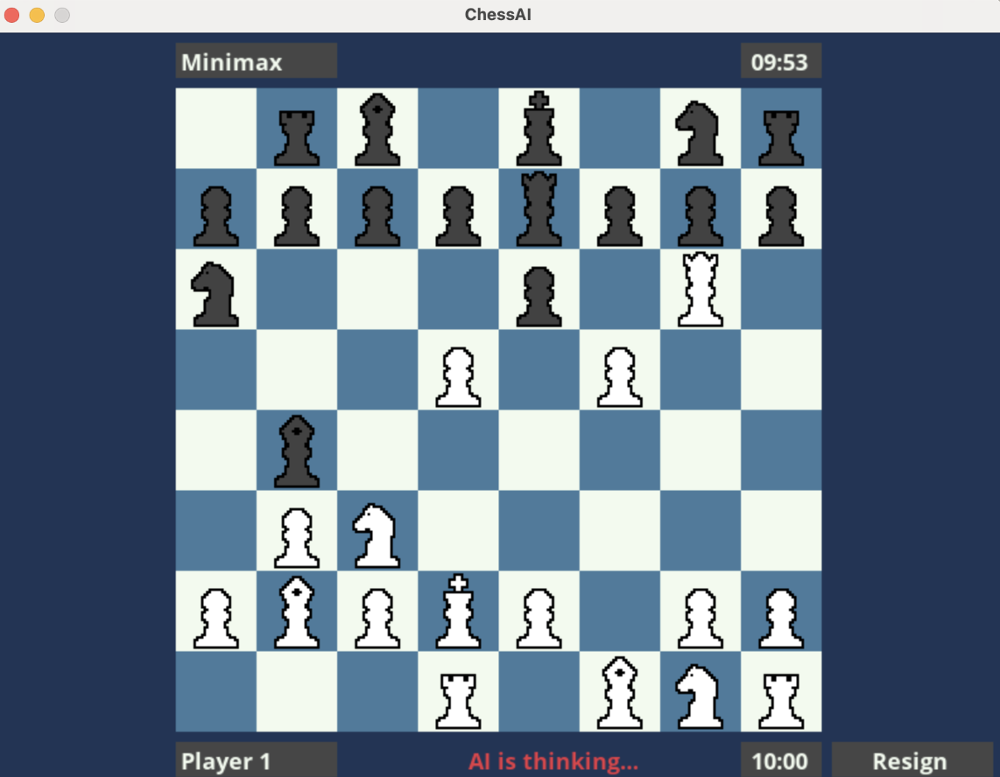

### Random v.s. AI
#### Minimax with Pruning v.s. Without pruning
##### With pruning code:
```
def minimax(board, depth, alpha, beta, maximizing_player, maximizing_color):
    if depth == 0 or board.gameover:
        return None, evaluate_board(board, maximizing_color)
    moves = board.get_moves()
    best_move = random.choice(moves)

    if maximizing_player:
        max_eval = -inf
        for move in moves:
            board.make_move(move[0], move[1])
            current_eval = minimax(board, depth-1, alpha, beta, False, maximizing_color)[1]
            board.unmake_move()
            if current_eval > max_eval:
                max_eval = current_eval
                best_move = move
            alpha = max(alpha, current_eval)
            if beta <= alpha:
                break
        return best_move, max_eval
    else:
        min_eval = inf
        for move in moves:
            board.make_move(move[0], move[1])
            current_eval = minimax(board, depth-1, alpha, beta, True, maximizing_color)[1]
            board.unmake_move()
            if current_eval < min_eval:
                min_eval = current_eval
                best_move = move
            beta = min(beta, current_eval)
            if beta <= alpha:
                break
        return best_move, min_eval
```
##### Without pruning code:
```
def no_pruning(board, depth, alpha, beta, maximizing, player_color):
    if depth == 0 or board.gameover:
        return None, evaluate_board(board, player_color)
    moves = board.get_moves()
    best_move = random.choice(moves)

    if maximizing:
        max_eval = -inf
        for move in moves:
            board.make_move(move[0], move[1])
            current_eval = minimax(board, depth-1, alpha, beta, False, player_color)[1]
            board.unmake_move()
            if current_eval > max_eval:
                max_eval = current_eval
                best_move = move
            alpha = max(alpha, current_eval)
            
        return best_move, max_eval
    else:
        min_eval = inf
        for move in moves:
            board.make_move(move[0], move[1])
            current_eval = minimax(board, depth-1, alpha, beta, True, player_color)[1]
            board.unmake_move()
            if current_eval < min_eval:
                min_eval = current_eval
                best_move = move
            beta = min(beta, current_eval)
            
        return best_move, min_eval
```
We can see that the main difference between these two codes is that in our normal minimax with pruning that we have a check for our alpha that if we get an alpha that is greater or equal to our beta, then the current branch will be pruned causing it to no longer search down that path. This essentially would cut down our computation time since it will not have to go down a path that we already know will not make the optimal move. 

### 5 Episodes
### Computation Time 
Graph A1: Computation time with pruning
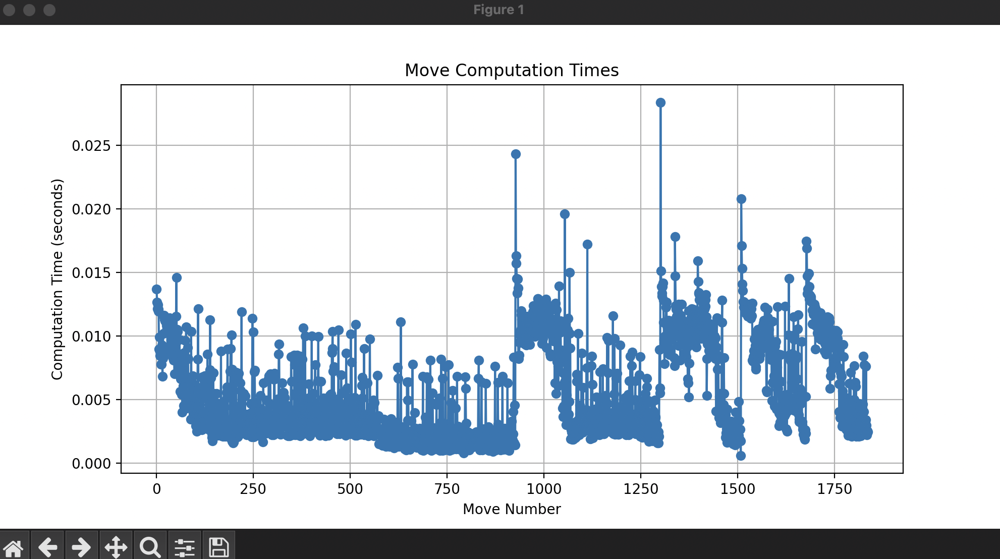
Graph A2: Computation time without pruning
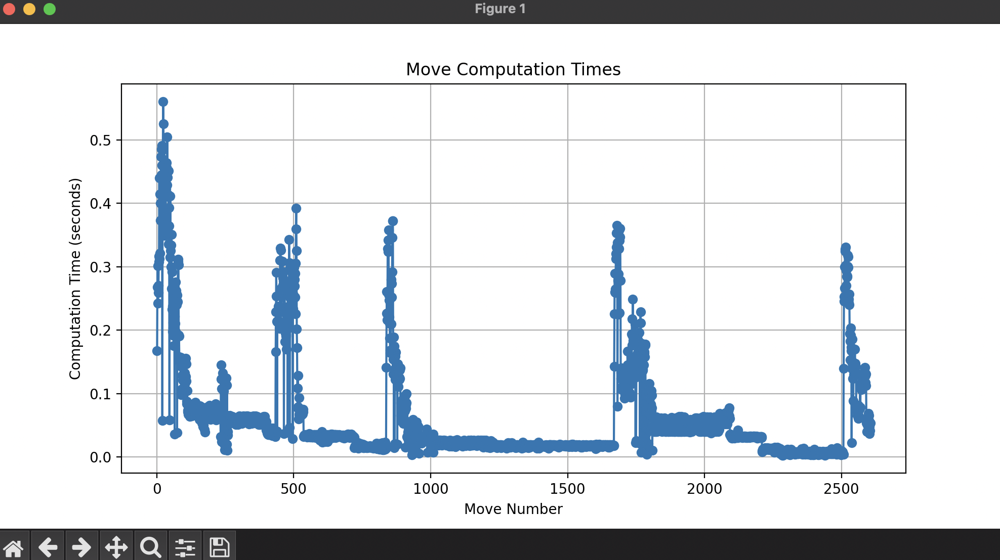

### Win Rate
Graph B1: Win rate with pruning (Player 2 is minimax)
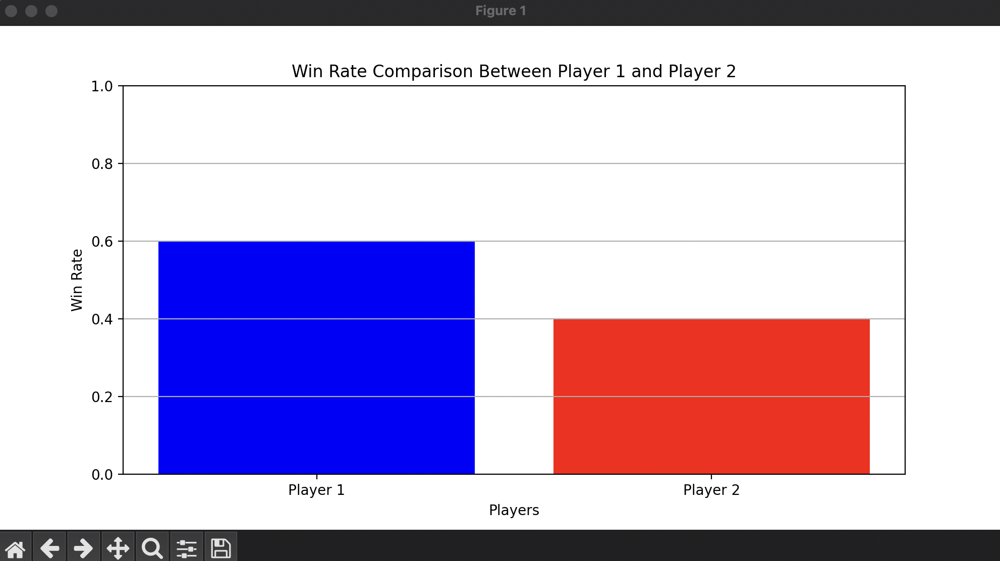
Graph B2: Win rate without pruning (Player 2 is minimax)
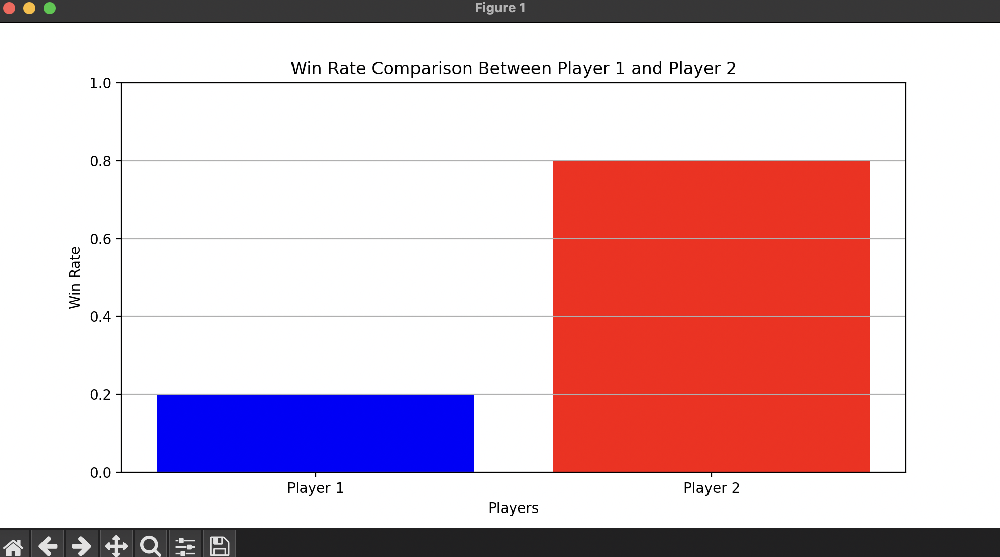

### Player Scores
Graph C1: Player score with pruning (Player 2 is minimax)
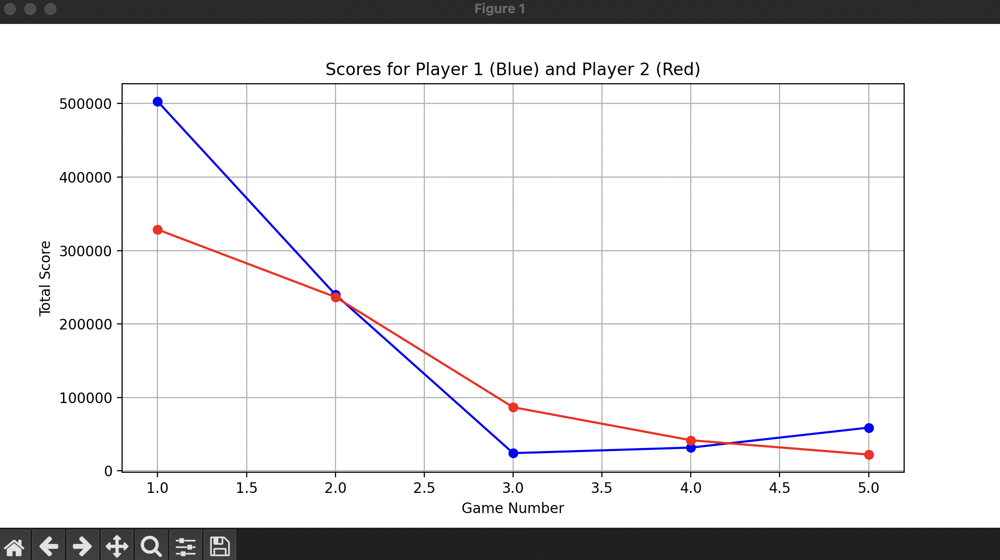
Graph C2: Player score without pruning (Player 2 is minimax)
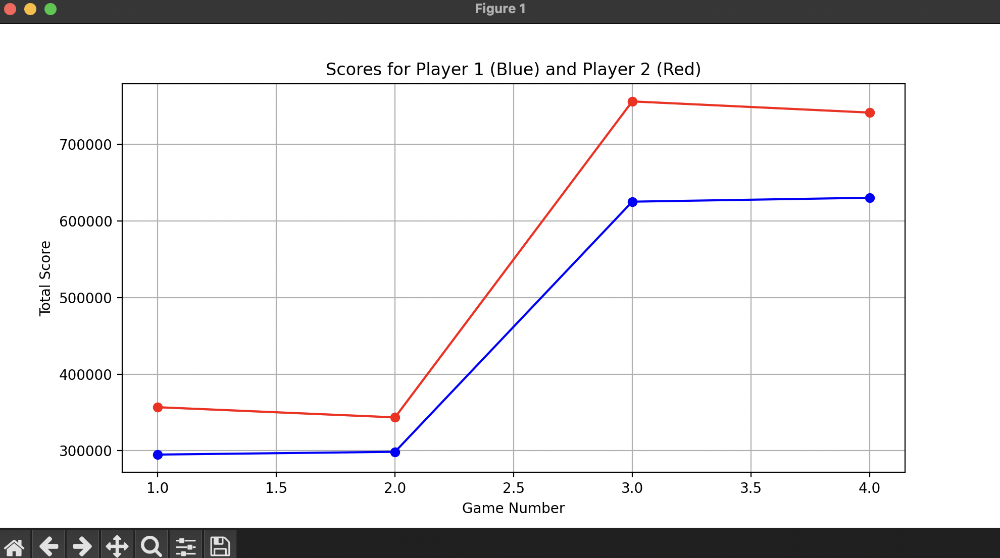

### 15 Episodes
### Computation Time
Graph D1: Computation time with pruning
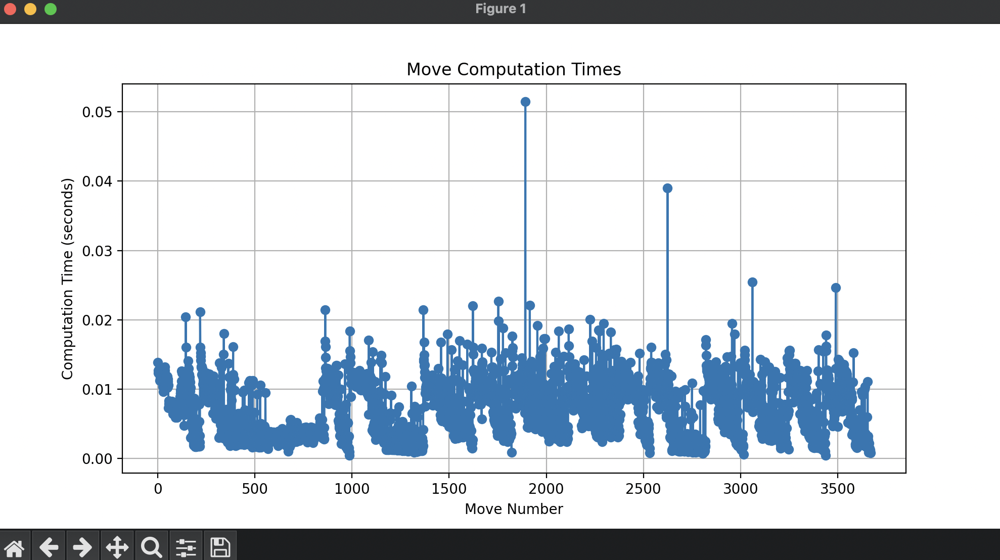
Graph D2:Computation time with pruning
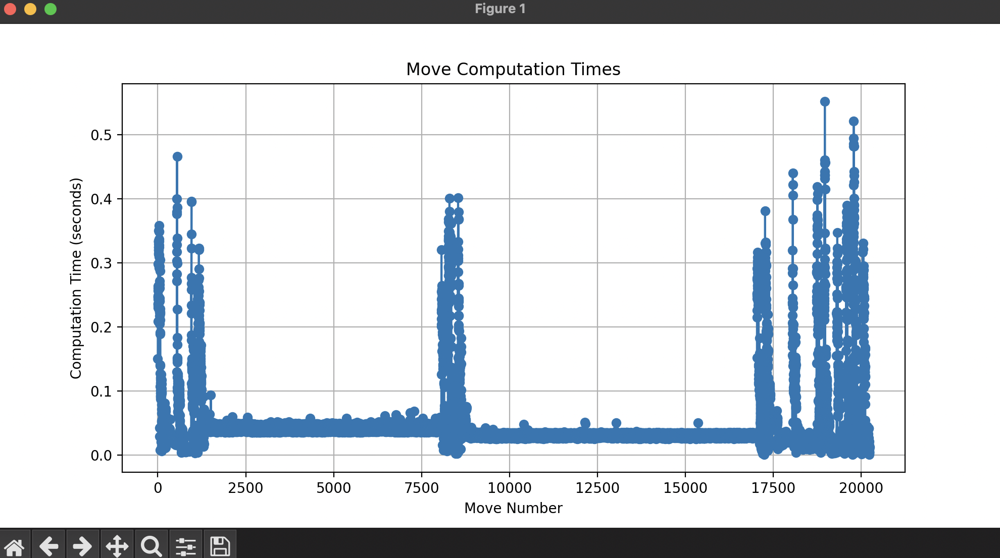

### Win Rate
Graph E1: Win rate with pruning (Player 2 is minimax)
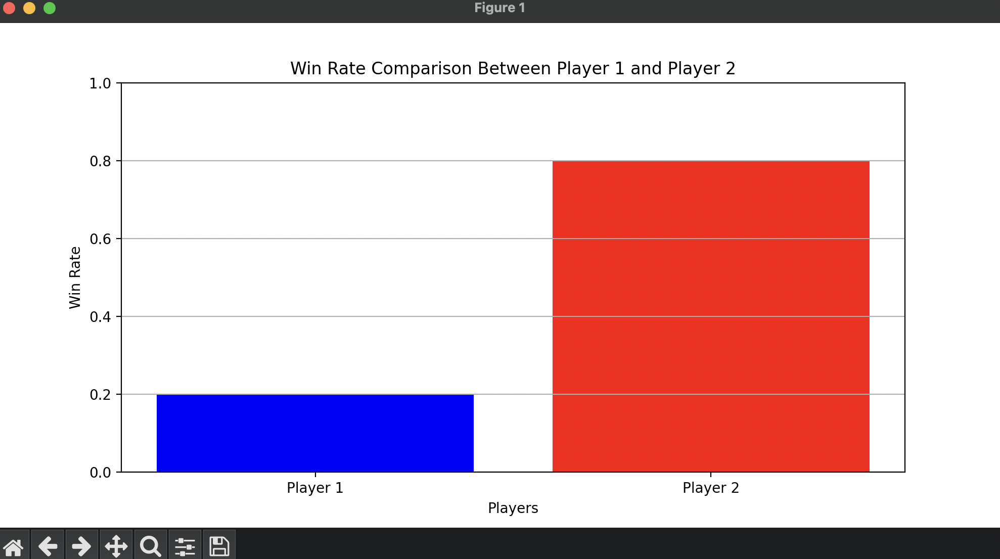
Graph E2: Win rate without pruning (Player 2 is minimax)
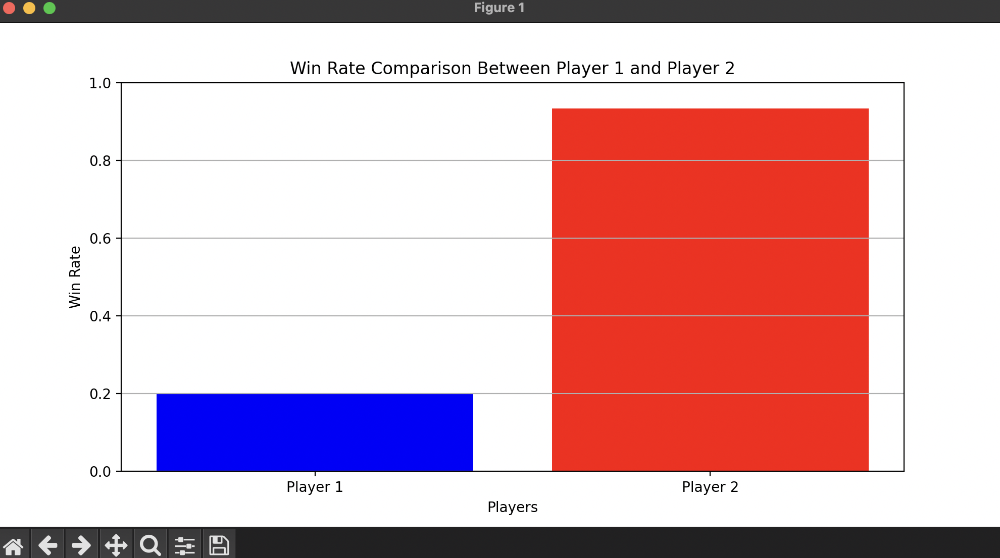

### Player Scores
Graph F1: Player score with pruning (Player 2 is minimax)
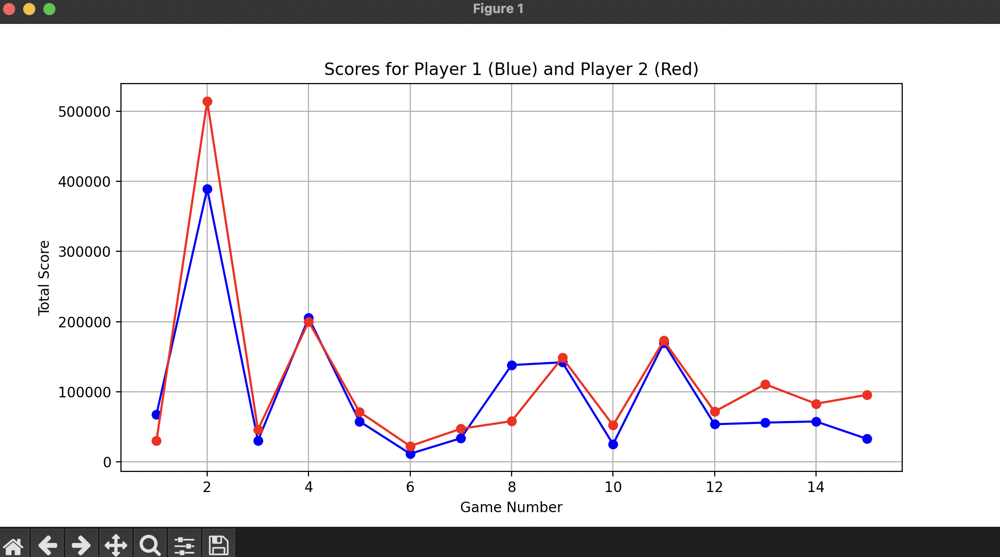
Graph F2: Player score without pruning (Player 2 is minimax)
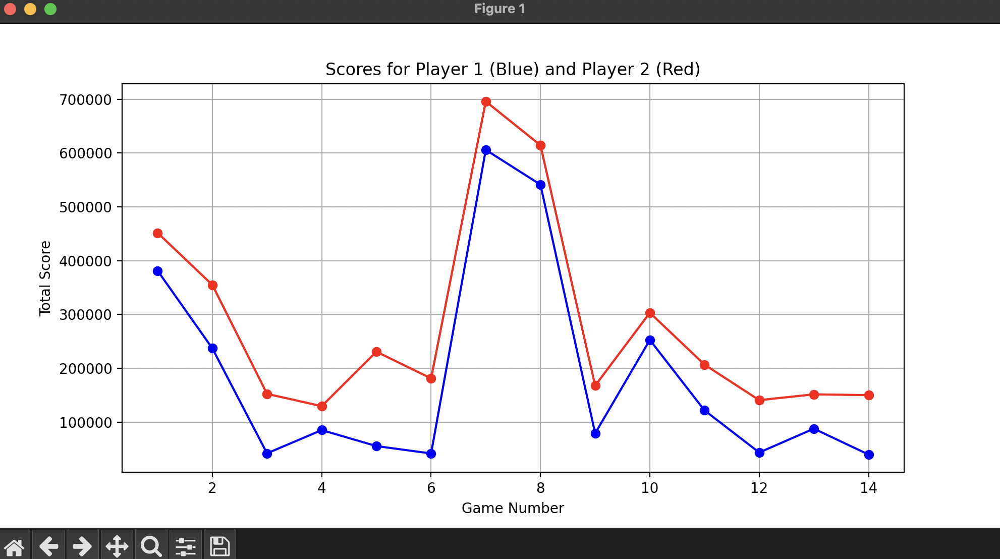

### Description of Graphs
From the graphs of the 5 episodes we can see that the minimax algorithm with pruning seems to not do as well as we expected but we see that it flips when training over 15 episodes. Although it may seem that pruning did not do as well based on the win rate in graph B1, we can still see how the computation time in graph A1 was significantly better with pruning showing its efficiency when choosing a move over non pruning in graph A2. As we see the 15 episodes games, our computation time in graph D1 still shows the result of how pruning did against non pruning being more efficient and our win rate for minimax with pruning in graph E1 significantly improves as we increase the number of episodes played. This is more consistent with our finding and hypothesis of how pruning would impact the efficiency of our algorithm.


### Monte Carlo
This code implements a Monte Carlo Tree Search (MCTS) algorithm, which is used to make decisions in game-playing AI. The node class encapsulates the MCTS process, including expansion, simulation (rollout), backpropagation, and node selection. The MCTS algorithm aims to balance exploration of new moves and exploitation of known good moves to find the optimal action efficiently. The reward was found through the simulation method and back propagated. 
```
def best_action(self, num_simulations=1000): 
    simulation_count = 0 
    while simulation_count < num_simulations:
        v = self.tree_policy() 
        reward = v.rollout() 
        v.backpropagate(reward) 
        simulation_count += 1 
    return self.best_child(c_param=0.0)

```


# Discussion

### Minimax With Pruning v.s. Without Pruning
#### Computation Time
The general idea for Minimax is the same whether it is with pruning or without pruning. We predicted a faster computation time for the games that run with pruning because it would be getting rid of branches that are unnecessary to evaluate.

Alpha-beta pruning enhances the Minimax algorithm by eliminating branches in the search tree that do not need to be explored because they cannot influence the final decision. The algorithm maintains two values, alpha and beta, which represent the minimum score that the maximizing player is assured of and the maximum score that the minimizing player is assured of, respectively.

As shown in the comparison of Graph D1 and D2, the computation times for choosing the best move is a lot more consistent with pruning. There is more variability with the times for when Minimax was not pruned. Furthermore, the longest it took to choose a move with pruning was just over 0.050 seconds, while the longest it took without pruning was close to 0.5 seconds. The difference between these two computation times is too large to ignore.

This significant discrepancy demonstrates the efficiency gained through alpha-beta pruning. When branches that cannot possibly influence the final decision are pruned, the search space is effectively reduced. This reduction in search space means fewer nodes are evaluated, leading to faster decision-making times.

In practical terms, this improvement in computation time allows for more sophisticated and deeper searches within the same time constraints, improving the overall performance of the game-playing algorithm. The consistency and speed with which moves are chosen when using alpha-beta pruning make it a crucial optimization for the Minimax algorithm, especially in games with a large search space or deeper decision trees.

#### Win Rate
The win rate, found by dividing the total number of games won by the total number of games played, as shown in Graph E1 and E2, is not significantly different between the scenarios with pruning and without pruning. Both approaches were able to achieve a higher win rate compared to the strategy of making random moves. This indicates that both the pruned and unpruned Minimax algorithms are more effective at identifying optimal moves than a random strategy.

In both cases, the algorithms demonstrated their capability to evaluate the game state and make decisions that lead to a winning outcome more frequently than random selection. This similarity in win rates suggests that the primary advantage of alpha-beta pruning is not in improving the quality of the moves found by the Minimax algorithm, but in enhancing the efficiency of the computation.

Despite the win rates being comparable, the faster computation times with pruning, as discussed earlier, mean that the pruned algorithm can search deeper in the game tree within the same time constraints. This ability to explore more possibilities more quickly can be crucial in time-sensitive environments, such as competitive gameplay or scenarios where the computational resources are limited.

Therefore, while the win rates for both pruned and unpruned algorithms are similar, alpha-beta pruning significantly enhances the efficiency of the Minimax algorithm. It reduces the computational burden by eliminating unnecessary evaluations, thereby allowing for faster decision-making without compromising the effectiveness of the strategy. This efficiency gain is particularly beneficial in real-world applications where both speed and performance are critical.

#### Different Number of Total Games Played
We tried to see if Minimax would have consistent results depending on how many total games were played. Our hypothesis was that Minimax would still have a higher win rate compared to taking random moves.

This experiment was based on the principle that Minimax, as a strategy-driven algorithm, evaluates possible moves by considering the opponent player's best responses, leading to more optimal decision-making compared to random moves. Random moves lack any strategy or foresight, so we expected it to perform worse regardless of the number of games played.

After conducting multiple experiments, we found that Minimax indeed maintained a higher win rate compared to random moves across varying numbers of total games played. The consistency of Minimax's performance was evident, demonstrating its robustness and effectiveness in choosing optimal moves. In contrast, the win rate for random moves remained relatively low, as expected, due to the absence of strategic evaluation. This reinforced the initial prediction and highlighted the superiority of Minimax in strategic gameplay scenarios.

#### Attempt on Monte Carlo Tree Search for Comparison
As a benchmark model to compare the efficiency and performance of Minimax, we also implemented Monte Carlo Tree Search (MCTS). MCTS is known for its ability to handle large and complex game trees by using random simulations to explore possible future states. However, we encountered significant challenges with MCTS in terms of computation time.

The primary issue was that the time required for MCTS to find the best optimal move was excessively long. This made direct comparisons between Minimax and MCTS challenging. While MCTS has the potential to find highly optimal moves through extensive exploration and simulation, its computational demands were too high for our testing environment.

Therefore, we concluded that the price of the computation time was too high for MCTS to be considered a suitable model compared to Minimax. Despite MCTS's potential for deeper strategic moves, its inefficiency in terms of time made it impractical for our purposes. Minimax, especially with alpha-beta pruning, proved to be more efficient and consistent, making it a more suitable choice for scenarios where computational resources and time are limited.

Some further exploration will be needed and it will be described further in the Limitation section.


### Limitations

#### Stockfish
Stockfish is a powerful open-source chess engine known for its playing strength and analytical capabilities. For its search algorithms, it also uses Minimax with Alpha-Beta Pruning as well as heuristics and evaluations. It gives the user recommendations on which move is optimal. 

If given more time, we would like to explore how to automate Stockfish so that the algorithm can self-play. This will allow us to compare computation time performance and win rate with our own Minimax Alpha Beta Pruning searching algorithm. 

#### Monte Carlo
It would be helpful to implement a time restraint on back propagation to navigate the issue we found. Implementing a time restraint on backpropagation in Monte Carlo Tree Search (MCTS) involves limiting the amount of time spent on updating the node statistics (number of visits and results) during the backpropagation phase. By doing so, it may decrease the optimality of the move, but the computation time would be reasonable. By setting a maximum time limit for backpropagation, we can ensure that MCTS operates within a predictable timeframe. This is crucial for applications where decisions must be made within a specified time budget, such as in this chess game simulation.

#### Reward Mechanism Improvements
Other than Stockfish and Monte Carlo, an improvement to our reward mechanism would be to implement a penalty reward for how many moves are taken for each player. By penalizing the AI for taking more moves than necessary to reach checkmate or a winning position, we can encourage it to seek shorter paths to victory, leading to a shorter total computation time. Furthermore, it would also be more effective to evaluate each piece’s value not only based on its type (pawn, bishop, etc.) but also on its current mobility potential. For example, for a remaining pawn, its mobility will be evaluated based on the number of legal moves it can take without being overtaken by the opponent player’s pieces. This considers both offensive (potential captures) and defensive (avoiding captures) aspects of piece mobility.


### Ethics & Privacy

Some unintended consequences that we may run into could be the enjoyment of people that would play against our AI if we are able to have a very strong model that is able to win consistently without error. This could lead to impacting the human and their enjoyment while playing which could create more consequences if this enjoyment leads to other violent actions per say. To address this we could implement a way for the AI to have levels of difficulty in order to make the player have a more fair chance of winning as well. 


### Conclusion
In conclusion, we see that the use of alpha-beta pruning in Minimax not only ensures a more efficient evaluation process but also that highlights the importance of pruning in achieving faster and more reliable computation times as clearly evidenced by the marked difference in performance shown in the comparison graphs. These computation times were approximately twice as fast than the minimax without pruning, showing its efficiency in cutting out wasted time when evaluating the next possible moves. Seeing how this algorithm performed with its win rate as well as the rewards accumulated in the game demonstrates the ability for Minimax to be a useful algorithm when evaluating rewards against an opponent. 

Some future work and direction that we would like to take is training our minimax model against Stockfish AI and figuring out ways to automate Stockfish in a way that can be played against our AI to evaluate what moves Stockfish makes in light of how our Minimax model performs. Similarly we would extend this performance model with the Monte Carlo to see how our Minimax performs when playing against Monte Carlo. We would like to ensure a limit on Monte Carlo’s backpropagation to mitigate the length of time it takes for the game to conclude between both players.

We would also like to improve our reward mechanism to have a penalty reward for the amount of steps and moves a player makes in order to limit unnecessary moves that are wasted for our Minimax algorithm. This would cause our algorithm to find a short path to the goal state thus leading to a shorter computation time. As well as implementing a reward that takes into account both defense and offense of the position that a certain piece is in to further deepen the Minimax algorithm’s understanding of finding the most optimal way of winning.


# Footnotes
<a name="britannicanote"></a>1.[^](#britannica): "The time element and competition." Encyclopædia Britannica, Encyclopædia Britannica, inc., Accessed May 13, 2024, https://www.britannica.com/topic/chess/The-time-element-and-competition. <br>
<a name="stanfordnote"></a>2.[^](#stanford): "Deep Blue." Stanford University, Accessed May 13, 2024, https://stanford.edu/~cpiech/cs221/apps/deepBlue.html#:~:text=In%201950%2C%20Claude%20Shannon%20published,into%20account%20the%20efficacy%20of. <br>
<a name="turingnote"></a>3.[^](#turing): “The Original Chess Engine: Alan Turing’s Turochamp.” Chess.com, April 24, 2021, https://www.chess.com/blog/the_real_greco/the-original-chess-engine-alan-turings-turochamp <br>
<a name="ibmnote"></a>4.[^](#ibm): “A Chess playing Program for the I.B.M.” Chess Review, Accessed June 3, 2024 https://d1yx3ys82bpsa0.cloudfront.net/chess/chess-review.a-chess-playing-program-for-the-ibm-704.bernstein.july-1958.062303058.pdf <br> <a name="zeronote"></a>5.[^](#zero): “Technical Explanation of Leela Chess Zero” Lc0, Accessed June 3, 2024 https://lczero.org/dev/wiki/technical-explanation-of-leela-chess-zero/ <br>
<a name="simplifiednote"></a>6.[^](#simplified): “Simplified Evaluation Function” Chess Program Wiki, February 23, 2021 https://www.chessprogramming.org/Simplified_Evaluation_Function <br>
